# DSA4212 Assignment 3 Group 21

#### **Travelling Salesman**

The file `cities.npy` contains the 2D coordinates $P_1, . . . , P_{1000}$ of N = 1000 cities. Find a permutation $\sigma(1), . . . , \sigma(N)$ of these $N$ cities that minimises the total length $L$ defined as  
$L = ∥P_{σ(2)} − P_{σ(1)}∥ + ∥P_{σ(3)} − P_{σ(2)}∥ + . . . + ∥P_{σ(N)} − P_{σ(N−1)}∥ + ∥P_{σ(1)} − P_{σ(N)}∥.$  
Note that $L$ is the length of a tour that visits each city once and comes back to the initial city.

### Setup

In [53]:
import numpy as np
import matplotlib.pyplot as plt 
from scipy.spatial.distance import cdist
from algos.greedy import Graph
from algos.nn import solver_nearest_neighbours
from algos.christofides import solver_christofides, get_cost
from algos.lkh import solver_lkh
from algos.bounds import mst_lower_bound
from algos.local_search import two_opt
from utils.graphics import draw_tour

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
cities = np.load("cities.npy", allow_pickle = True)

Text(0, 0.5, '$y$')

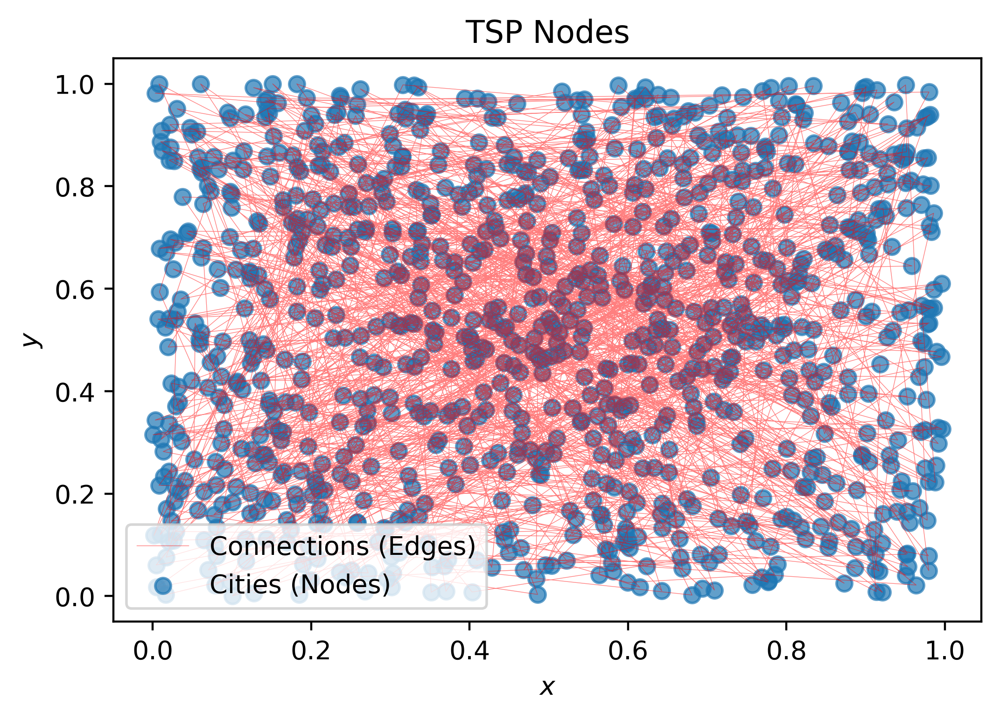

In [7]:
# visualise the nodes
plt.figure(dpi=400)
plt.scatter(cities[:,0], cities[:,1], alpha=0.7, label="Cities (Nodes)")
plt.plot(cities[:,0], cities[:,1], alpha=0.5, color="red", linewidth=0.25, label="Connections (Edges)")
plt.legend()
plt.title("TSP Nodes");plt.xlabel("$x$");plt.ylabel("$y$")

In [8]:
dist_matrix = cdist(cities, cities)
dist_matrix, dist_matrix.shape

(array([[0.        , 0.34838355, 0.38578866, ..., 0.61873281, 0.39415652,
         0.41012412],
        [0.34838355, 0.        , 0.39901093, ..., 0.41217627, 0.41862477,
         0.54573393],
        [0.38578866, 0.39901093, 0.        , ..., 0.32290609, 0.02020306,
         0.18089399],
        ...,
        [0.61873281, 0.41217627, 0.32290609, ..., 0.        , 0.33504518,
         0.49202713],
        [0.39415652, 0.41862477, 0.02020306, ..., 0.33504518, 0.        ,
         0.16344243],
        [0.41012412, 0.54573393, 0.18089399, ..., 0.49202713, 0.16344243,
         0.        ]]),
 (1000, 1000))

In [52]:
mst_lb = mst_lower_bound(dist_matrix)
mst_lb

21.1056494690461

### Nearest Neighbours

In [14]:
min_route, min_dist = solver_nearest_neighbours(dist_matrix, random=False) 
min_dist

28.937238608461758

In [15]:
# try every node as the starting position
best_cities = cities.copy()
for index in range(1000):
    city_copy = cities.copy()
    
    store = city_copy[0].copy()
    city_copy[0] = city_copy[index].copy()
    city_copy[index] = store
    
    dist_matrix_copy = cdist(city_copy, city_copy)
    
    new_route, new_dist = solver_nearest_neighbours(dist_matrix_copy, random=False) 
    if new_dist < min_dist:
        print(new_dist)
        min_dist = new_dist
        min_route = new_route
        best_cities = city_copy.copy()

28.7891791712778
28.484368104659634
28.170166703582268
28.112471458255822
28.089023976830752
28.07166853559722
27.993855556967723
27.941078133945727
27.93683540049367


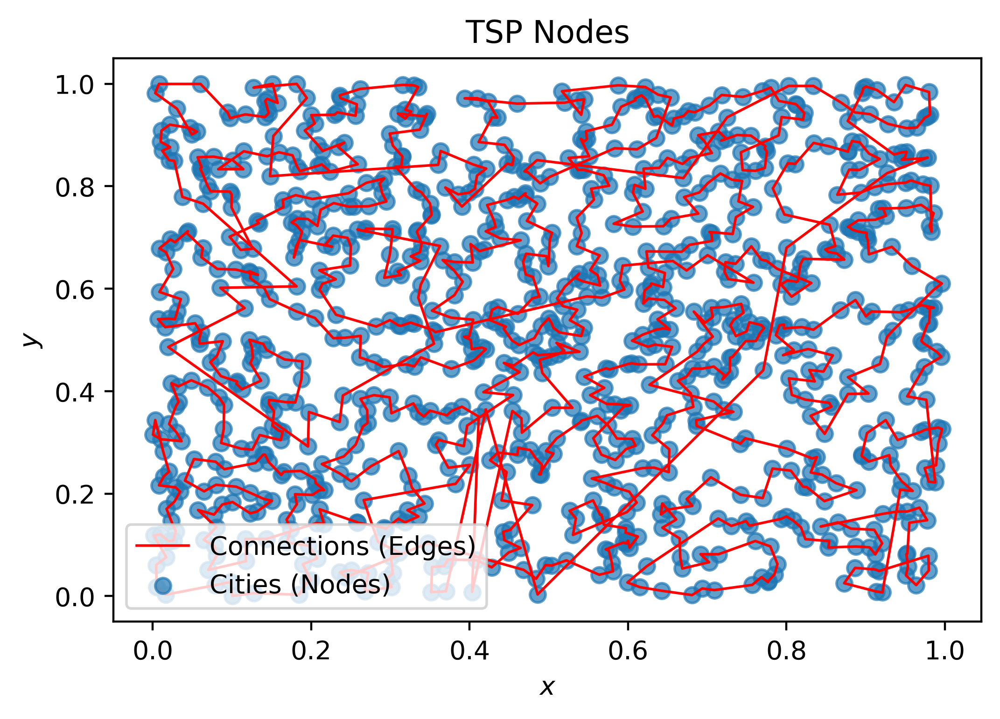

In [17]:
draw_tour(cities, min_route)

### Greedy

In [38]:
graph = Graph(cities.copy())

In [39]:
greedy_cost, edges, greedy_tour = graph.tsp()
greedy_cost

26.528508254434513

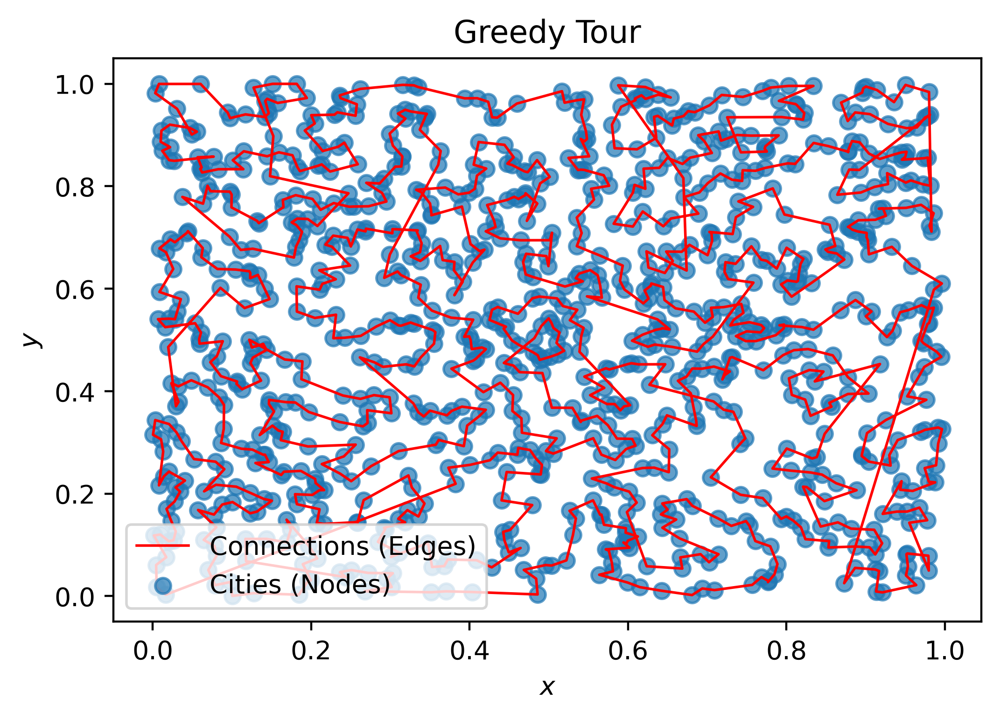

In [40]:
draw_tour(cities,route, title="Greedy Tour")

### Lin-Kernighan

In [32]:
lkh_tour, lkh_cost = solver_lkh(dist_matrix) 

In [58]:
lkh_cost

23.50669106698797

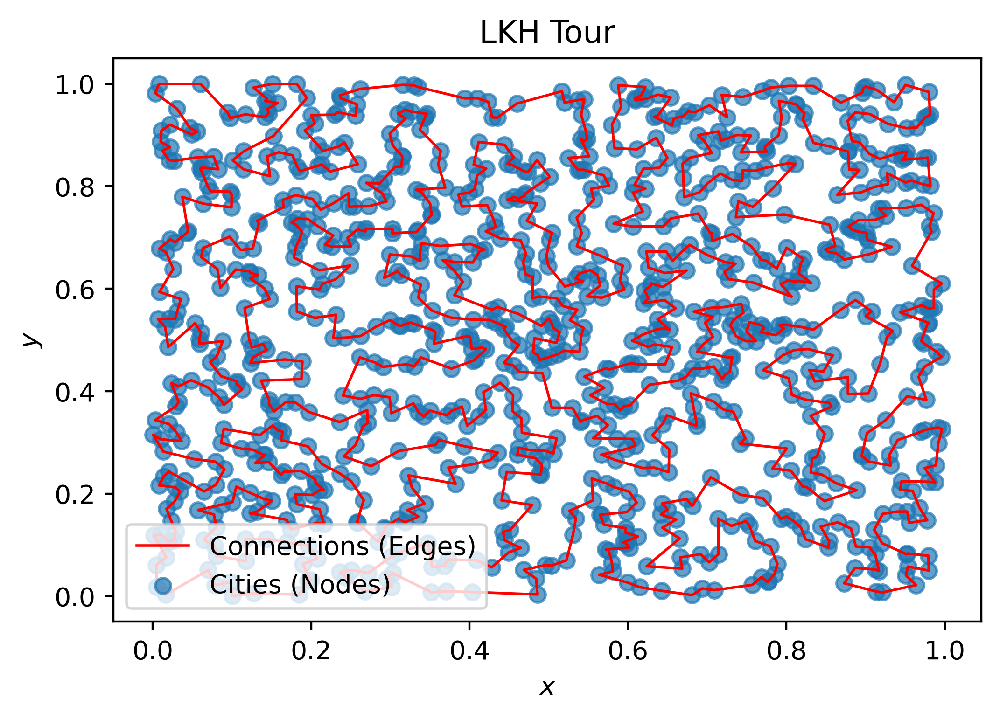

In [35]:
draw_tour(cities, lkh_tour, title="LKH Tour")

### Christofides

In [36]:
c_tour,c_cost = solver_christofides(dist_matrix)
c_cost

26.548758468221216

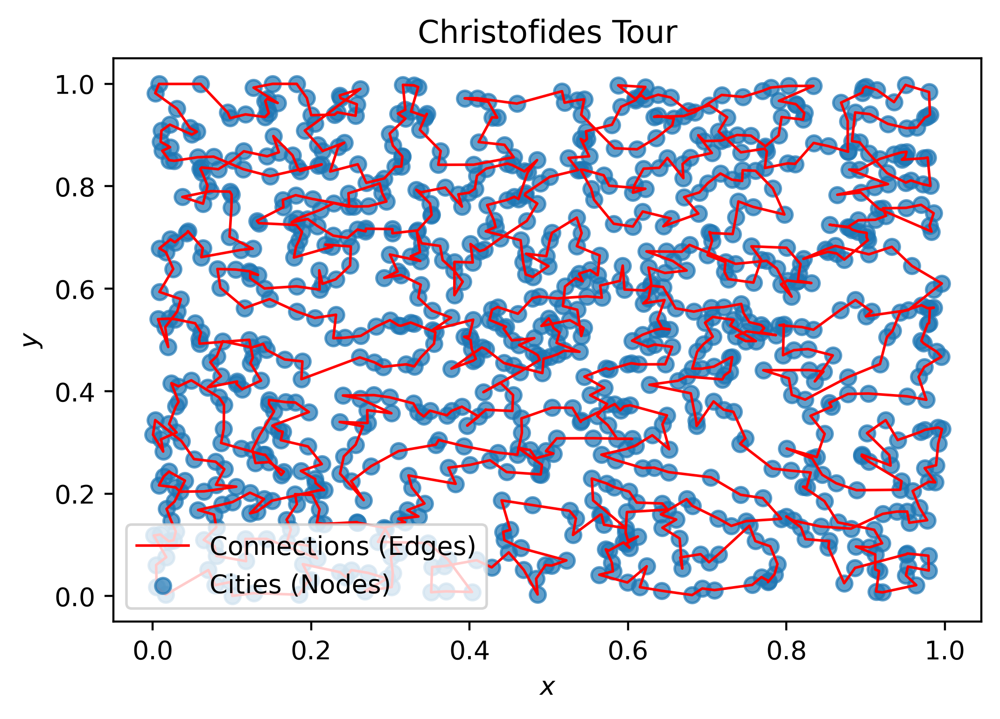

In [37]:
draw_tour(cities, c_tour, title="Christofides Tour")

In [54]:
tc_tour = two_opt(c_tour, dist_matrix)

In [57]:
get_cost(tc_tour, dist_matrix)

24.693258210990123

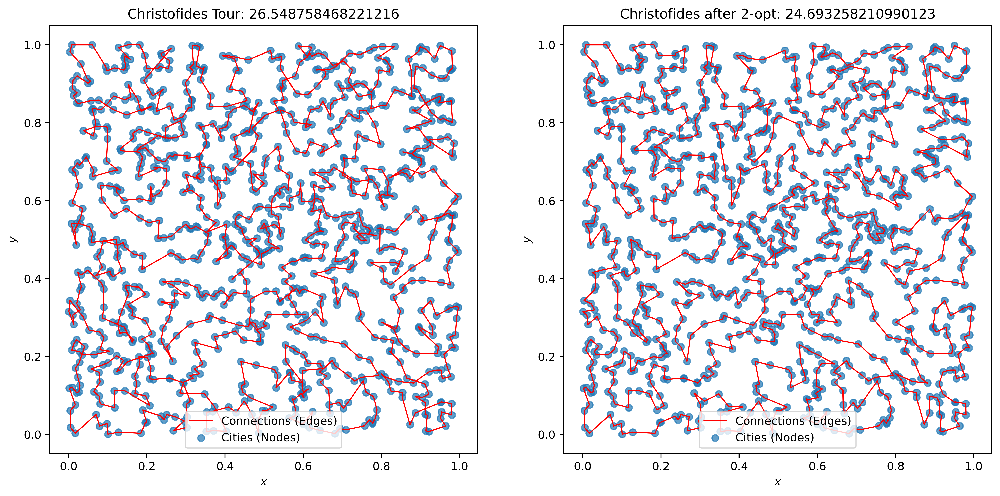

In [63]:
plt.figure(dpi = 400, figsize=(15,7))
plt.subplot(1,2,2)
draw_tour(cities, tc_tour, title=f"Christofides after 2-opt: {get_cost(tc_tour, dist_matrix)}")
plt.subplot(1,2,1)
draw_tour(cities, c_tour, title=f"Christofides Tour: {c_cost}")

### Comparisons

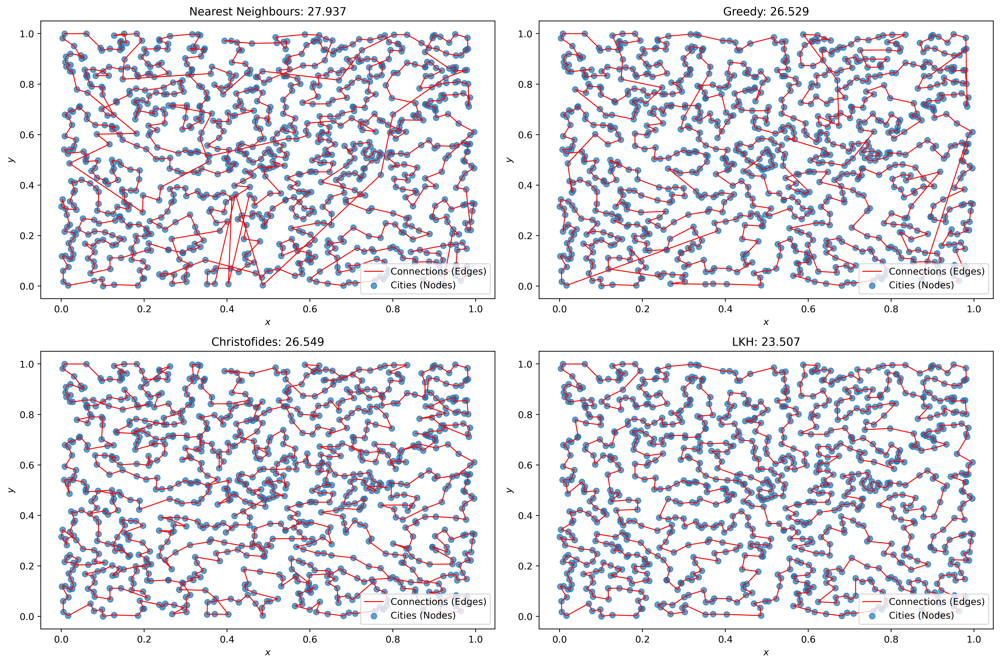

In [51]:
plt.figure(figsize=(15,10),  dpi=400)

plt.subplot(2,2,1)
draw_tour(cities, min_route, title=f"Nearest Neighbours: {min_dist:.3f}")
plt.subplot(2,2,2)
draw_tour(cities, greedy_tour, title=f"Greedy: {greedy_cost:.3f}")
plt.subplot(2,2,3)
draw_tour(cities, c_tour, title=f"Christofides: {c_cost:.3f}")
plt.subplot(2,2,4)
draw_tour(cities, lkh_tour, title=f"LKH: {lkh_cost:.3f}")

plt.tight_layout()

### Tour Improvements